# Mean of Circular Quantities (MCQ) calculator

### Zok, T., Popenda, M. & Szachniuk, M. MCQ4Structures to compute similarity of molecule structures. Cent Eur J Oper Res 22, 457–473 (2014). https://doi.org/10.1007/s10100-013-0296-5

### Import modules

In [1]:
import barnaba as bb
import mdtraj as md
import numpy as np
import pandas as pd
import pathlib
from tqdm import tqdm
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
from scipy.spatial.distance import squareform
import os
from collections import defaultdict
from MDAnalysis import Universe
from MDAnalysis.coordinates.PDB import PDBWriter

/Users/massimodellepiane/Developer/MD_analysis/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


### BARNABA dihedral calculation functions

In [2]:
def calculate_dihedrals(rna_structure):
    # Calculate backbone torsion angles
    backbone_angles, backbone_residues = bb.backbone_angles_traj(rna_structure)
    
    # Calculate sugar torsion angles
    sugar_angles, sugar_residues = bb.sugar_angles_traj(rna_structure)
    
    # Combine the results
    dihedrals = {}
    for i, residue in enumerate(backbone_residues):
        dihedrals[residue] = {
            'backbone': backbone_angles[0, i, :],
            'sugar': sugar_angles[0, i, :]
        }
    
    return dihedrals

In [3]:
def dihedrals_to_dataframe(dihedrals, mol_id="1"):
    rows = []
    for resname, values in dihedrals.items():
        backbone = values["backbone"]
        sugar = values["sugar"]
        row = {
            "molecule": mol_id,
            "residue": resname,
            "alpha": backbone[0],
            "beta": backbone[1],
            "gamma": backbone[2],
            "delta": backbone[3],
            "epsilon": backbone[4],
            "zeta": backbone[5],
            "chi": backbone[6],
            "nu0": sugar[0],
            "nu1": sugar[1],
            "nu2": sugar[2],
            "nu3": sugar[3],
            "nu4": sugar[4],
        }
        rows.append(row)
    return pd.DataFrame(rows)


In [4]:
def dataframe_to_dihedrals(df):
    """
    Converts the df_all DataFrame into a dictionary mapping each molecule ID to its dihedral data.
    Each molecule is represented as a dictionary keyed by residue ID containing:
      - 'backbone': numpy array of [alpha, beta, gamma, delta, epsilon, zeta, chi]
      - 'sugar': numpy array of [nu0, nu1, nu2, nu3, nu4]
    """
    dihedrals = {}
    # Group by the molecule identifier
    for mol_id, group in df.groupby("molecule"):
        res_dict = {}
        # Iterate over each residue row in the molecule group
        for _, row in group.iterrows():
            residue_id = row["residue"]
            backbone = np.array([row["alpha"], row["beta"], row["gamma"],
                                 row["delta"], row["epsilon"], row["zeta"],
                                 row["chi"]])
            sugar = np.array([row["nu0"], row["nu1"], row["nu2"],
                              row["nu3"], row["nu4"]])
            res_dict[residue_id] = {"backbone": backbone, "sugar": sugar}
        dihedrals[mol_id] = res_dict
    return dihedrals

### MCQ Calculation functions

In [5]:
def mod_angle(t):
    """
    Returns the angle modulo 2π.
    """
    return (t + 2*np.pi) % (2*np.pi)

def angle_difference(t1, t2):
    """
    Computes the undirected difference between two angles in radians.
    If either angle is NaN, returns π.
    """
    if np.isnan(t1) and np.isnan(t2):
        return 0.0
    elif np.isnan(t1) or np.isnan(t2):
        return np.pi
    diff = abs(mod_angle(t1) - mod_angle(t2))
    return min(diff, 2*np.pi - diff)

In [6]:
def compute_mcq_distance_full(dihedrals1, dihedrals2, sources=['backbone', 'sugar']):
    """
    Computes the global MCQ distance between two molecules using both backbone and sugar angles.
    
    Parameters:
      dihedrals1, dihedrals2: dictionaries keyed by residue ID.
      Each value should be a dictionary with keys 'backbone' and 'sugar' containing arrays of angles.
      sources: list of keys to combine (default uses both 'backbone' and 'sugar').
    
    Returns:
      The global MCQ distance (in radians).
    """
    total_sin = 0.0
    total_cos = 0.0
    count = 0
    common_residues = set(dihedrals1.keys()).intersection(dihedrals2.keys())
    for res in common_residues:
        for source in sources:
            angles1 = dihedrals1[res][source]
            angles2 = dihedrals2[res][source]
            for i in range(len(angles1)):
                diff = angle_difference(angles1[i], angles2[i])
                total_sin += np.sin(diff)
                total_cos += np.cos(diff)
                count += 1
    avg_sin = total_sin / count
    avg_cos = total_cos / count
    return np.arctan2(avg_sin, avg_cos)

In [7]:
def compute_mcq_distance_backbone_chain0(dihedrals1, dihedrals2):
    """
    Computes the global MCQ distance between two molecules using only the backbone torsion angles
    (α, β, γ, δ, ε, ζ, χ) for residues in the first chain (residue IDs ending with '_0').
    
    Parameters:
        dihedrals1, dihedrals2: dictionaries keyed by residue ID,
          where each residue entry is a dictionary containing a 'backbone' key with a 7-element array.
    
    Returns:
        The global MCQ distance (in radians), or None if no common chain0 residues are found.
    """
    total_sin = 0.0
    total_cos = 0.0
    count = 0
    
    # Find common residues and then filter only those from chain 0 (i.e. ending with '_0')
    common_residues = set(dihedrals1.keys()).intersection(dihedrals2.keys())
    chain0_residues = [res for res in common_residues if res.endswith('_0')]
    
    for res in chain0_residues:
        angles1 = dihedrals1[res]['backbone']  # Array of 7 backbone angles
        angles2 = dihedrals2[res]['backbone']
        for i in range(len(angles1)):
            diff = angle_difference(angles1[i], angles2[i])
            total_sin += np.sin(diff)
            total_cos += np.cos(diff)
            count += 1
    
    if count == 0:
        return None  # No common chain0 residues found
    avg_sin = total_sin / count
    avg_cos = total_cos / count
    return np.arctan2(avg_sin, avg_cos)

### Import files

In [8]:
# Define your input molecules as a list of (ID, path) tuples
structures = [
    ("1", "/Users/massimodellepiane/Downloads/cl1_str1.pdb"),
    ("2", "/Users/massimodellepiane/Downloads/cl1_str2.pdb"),
    ("3", "/Users/massimodellepiane/Downloads/cl2_str1.pdb"),
    ("4", "/Users/massimodellepiane/Downloads/cl2_str2.pdb"),
    # add more here
]

### Calculate dihedrals

In [9]:
all_dataframes = []

for mol_id, path in structures:
    traj = md.load(path)
    dihedrals = calculate_dihedrals(traj)
    df = dihedrals_to_dataframe(dihedrals, mol_id=mol_id)
    all_dataframes.append(df)

df_all = pd.concat(all_dataframes, ignore_index=True)

OSError: No such file: /Users/massimodellepiane/Downloads/cl1_str1.pdb

In [ ]:
df_all.head()

In [ ]:
df_all.to_csv("/Users/massimodellepiane/Desktop/rna_dihedrals_all_molecules.csv", index=False)

### Conversion to dictionary

In [ ]:
# Convert df_all into our dihedrals dictionary
dihedrals_all = dataframe_to_dihedrals(df_all)

### MCQ calculation between molecules

In [ ]:
# Get a list of molecule IDs from the DataFrame
mol_ids = list(dihedrals_all.keys())
if len(mol_ids) >= 2:
    # Compare the first two molecules
    mol1 = mol_ids[0]
    mol2 = mol_ids[1]
    global_distance = compute_mcq_distance_full(dihedrals_all[mol1], dihedrals_all[mol2])
    print(f"Global MCQ distance between {mol1} and {mol2} (radians): {global_distance}")

Global MCQ distance between 1 and 2 (radians): 0.17540011750635676


### Pairwise MCQ calculation

In [ ]:
# Get a list of molecule IDs from dihedrals_all
molecule_ids = list(dihedrals_all.keys())

# Initialize an empty DataFrame for pairwise distances
pairwise_distances = pd.DataFrame(index=molecule_ids, columns=molecule_ids, dtype=float)

# Compute the pairwise global MCQ distances
for i, mol_id1 in enumerate(molecule_ids):
    for j, mol_id2 in enumerate(molecule_ids):
        if i == j:
            pairwise_distances.loc[mol_id1, mol_id2] = 0.0
        elif pd.isnull(pairwise_distances.loc[mol_id1, mol_id2]):
            # Compute the distance only once per pair and mirror it.
            d = compute_mcq_distance_full(dihedrals_all[mol_id1], dihedrals_all[mol_id2])
            pairwise_distances.loc[mol_id1, mol_id2] = d
            pairwise_distances.loc[mol_id2, mol_id1] = d

# Display the resulting pairwise distance matrix
pairwise_distances

,1,2,3,4
1,0.000000,0.175400,0.171454,0.196373
2,0.175400,0.000000,0.191049,0.207551
3,0.171454,0.191049,0.000000,0.203414
4,0.196373,0.207551,0.203414,0.000000


#### Compare with RNATango website implementation

In [ ]:
# Get a list of molecule IDs from the dihedrals_all dictionary
molecule_ids = list(dihedrals_all.keys())

# Initialize an empty DataFrame for pairwise distances
pairwise_distances_chain0 = pd.DataFrame(index=molecule_ids, columns=molecule_ids, dtype=float)

# Compute the pairwise global MCQ distances for chain0 using backbone angles only
for i, mol_id1 in enumerate(molecule_ids):
    for j, mol_id2 in enumerate(molecule_ids):
        if i == j:
            pairwise_distances_chain0.loc[mol_id1, mol_id2] = 0.0
        elif pd.isnull(pairwise_distances_chain0.loc[mol_id1, mol_id2]):
            d = compute_mcq_distance_backbone_chain0(dihedrals_all[mol_id1], dihedrals_all[mol_id2])
            pairwise_distances_chain0.loc[mol_id1, mol_id2] = d
            pairwise_distances_chain0.loc[mol_id2, mol_id1] = d

# Display the resulting pairwise distance matrix
pairwise_distances_chain0

,1,2,3,4
1,0.000000,0.203470,0.171240,0.199266
2,0.203470,0.000000,0.193561,0.240318
3,0.171240,0.193561,0.000000,0.200048
4,0.199266,0.240318,0.200048,0.000000


In [ ]:
# Convert radians to degrees for direct comparison
pairwise_degrees = pairwise_distances_chain0.applymap(np.degrees)
pairwise_degrees.index = ['cl1_str1.pdb', 'cl1_str2.pdb', 'cl2_str1.pdb', 'cl2_str2.pdb']
pairwise_degrees.columns = ['cl1_str1.pdb', 'cl1_str2.pdb', 'cl2_str1.pdb', 'cl2_str2.pdb']
print(np.round(pairwise_degrees, 2))

              cl1_str1.pdb  cl1_str2.pdb  cl2_str1.pdb  cl2_str2.pdb
cl1_str1.pdb          0.00         11.66          9.81         11.42
cl1_str2.pdb         11.66          0.00         11.09         13.77
cl2_str1.pdb          9.81         11.09          0.00         11.46
cl2_str2.pdb         11.42         13.77         11.46          0.00


/var/folders/40/94jr3_2d3yg7w38vxswjd7fr0000gn/T/ipykernel_20608/2840899081.py:2: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  pairwise_degrees = pairwise_distances_chain0.applymap(np.degrees)


### Calculation on all 5000 duplexes pdbs

In [10]:
folder_path = pathlib.Path("/Volumes/Sim_Data/uni-bremen/miRNA/data/Sim/MD_duplex/amber99_parmbsc_chiOL3/REST/CD/DUPLEXES/selection/pdb_selection")  # point this to your directory
pdb_files = sorted(folder_path.glob("miRNA*.pdb"))  # or "miRNA_*.pdb" if you want that pattern specifically

In [ ]:
all_dataframes = []
for pdb_file in pdb_files:
    # read the structure
    traj = md.load(str(pdb_file))
    # compute the dihedrals dictionary
    dihedrals_dict = calculate_dihedrals(traj)
    # convert to a dataframe with an ID = the filename stem
    df = dihedrals_to_dataframe(dihedrals_dict, mol_id=pdb_file.stem)
    all_dataframes.append(df)

df_all = pd.concat(all_dataframes, ignore_index=True)

Exception ignored in: <bound method IPythonKernel._clean_thread_parent_frames of <ipykernel.ipkernel.IPythonKernel object at 0x10876d3c0>>
Traceback (most recent call last):
  File "/Users/massimodellepiane/Developer/MD_analysis/lib/python3.10/site-packages/ipykernel/ipkernel.py", line 775, in _clean_thread_parent_frames
    def _clean_thread_parent_frames(
KeyboardInterrupt: 


In [ ]:
df_all.to_csv("/Volumes/Sim_Data/uni-bremen/miRNA/data/Sim/MD_duplex/amber99_parmbsc_chiOL3/REST/CD/DUPLEXES/selection/pdb_selection/duplex_dihedrals_all.csv", index=False)
print("All dihedrals saved to CSV")


All dihedrals saved to CSV


In [11]:
# Instead of recalculating, load the CSV directly
df_all = pd.read_csv("/Volumes/Sim_Data/uni-bremen/miRNA/data/Sim/MD_duplex/amber99_parmbsc_chiOL3/REST/CD/DUPLEXES/selection/pdb_selection/duplex_dihedrals_all.csv")

In [12]:
# Convert the combined DataFrame into the large dict keyed by molecule ID
dihedrals_all = dataframe_to_dihedrals(df_all)

In [25]:
# Now build the full NxN MCQ matrix
molecule_ids = list(dihedrals_all.keys())
n = len(molecule_ids)
pairwise_distances = pd.DataFrame(index=molecule_ids, columns=molecule_ids, dtype=float)

# We have (n*(n+1))/2 total computations in a symmetric NxN matrix
total_calculations = n*(n+1)//2

count = 0
with tqdm(total=total_calculations, desc="Computing pairwise MCQ") as pbar:
    for i in range(n):
        mol_id1 = molecule_ids[i]
        for j in range(i, n):
            mol_id2 = molecule_ids[j]
            if i == j:
                pairwise_distances.loc[mol_id1, mol_id2] = 0.0
            else:
                d = compute_mcq_distance_full(dihedrals_all[mol_id1], dihedrals_all[mol_id2])
                pairwise_distances.loc[mol_id1, mol_id2] = d
                pairwise_distances.loc[mol_id2, mol_id1] = d

            count += 1
            pbar.update(1)

# Optionally save the matrix to CSV
pairwise_distances.to_csv("/Volumes/Sim_Data/uni-bremen/miRNA/data/Sim/MD_duplex/amber99_parmbsc_chiOL3/REST/CD/DUPLEXES/selection/pdb_selection/pairwise_mcq_matrix.csv")

print("Done. Pairwise MCQ matrix saved.")

Computing pairwise MCQ: 100%|██████████| 12502500/12502500 [3:28:53<00:00, 997.54it/s]  


Done. Pairwise MCQ matrix saved.


In [13]:
# Instead of recalculating, load the CSV directly
pairwise_distances = pd.read_csv(
    "/Volumes/Sim_Data/uni-bremen/miRNA/data/Sim/MD_duplex/amber99_parmbsc_chiOL3/REST/CD/DUPLEXES/selection/pdb_selection/pairwise_mcq_matrix.csv",
    index_col=0
)
pairwise_distances = pairwise_distances.astype(float)

In [14]:
print("Max value (raw):", pairwise_distances.values.max())
print("Min value (raw):", pairwise_distances.values.min())

Max value (raw): 0.7378529982587164
Min value (raw): 0.0


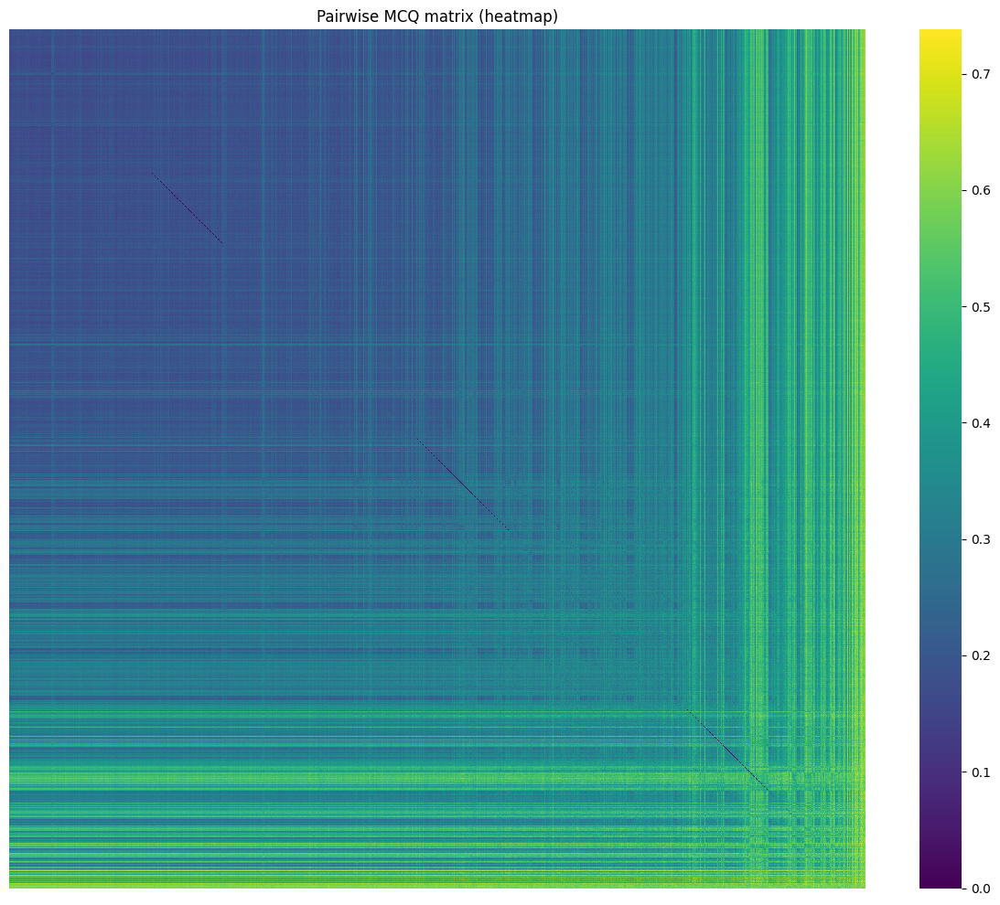

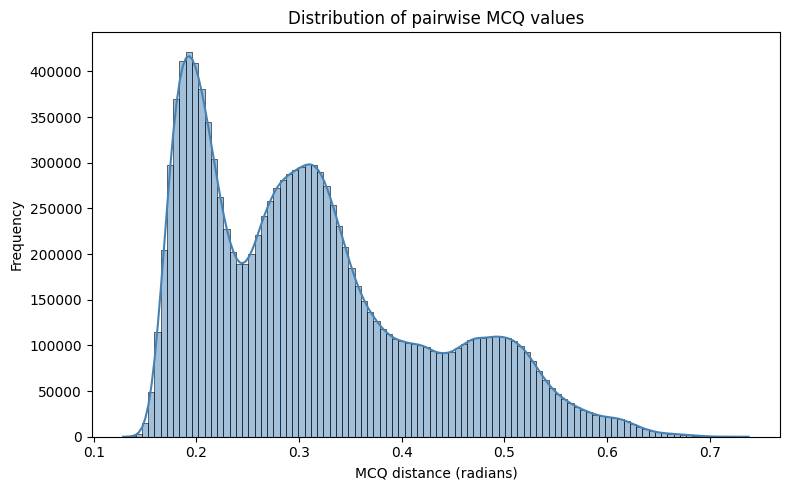

In [15]:
#pairwise_distances = np.degrees(pairwise_distances)

# 1. Heatmap of the pairwise MCQ matrix
plt.figure(figsize=(12, 10))
sns.heatmap(pairwise_distances, cmap="viridis", xticklabels=False, yticklabels=False)
plt.title("Pairwise MCQ matrix (heatmap)")
plt.tight_layout()
plt.savefig("mcq_heatmap.png", dpi=300)
plt.show()

# 2. Distribution of the off-diagonal MCQ values
upper_vals = pairwise_distances.where(np.triu(np.ones(pairwise_distances.shape), k=1).astype(bool)).stack()

plt.figure(figsize=(8, 5))
sns.histplot(upper_vals, bins=100, kde=True, color="steelblue")
plt.xlabel("MCQ distance (radians)")
plt.ylabel("Frequency")
plt.title("Distribution of pairwise MCQ values")
plt.tight_layout()
plt.savefig("mcq_distribution.png", dpi=300)
plt.show()

In [16]:
# Assuming nrmsd_matrix is your full square NRMSD matrix
condensed_matrix = squareform(pairwise_distances)

In [17]:
# Using Ward's method for clustering
Z = linkage(condensed_matrix, method='ward')

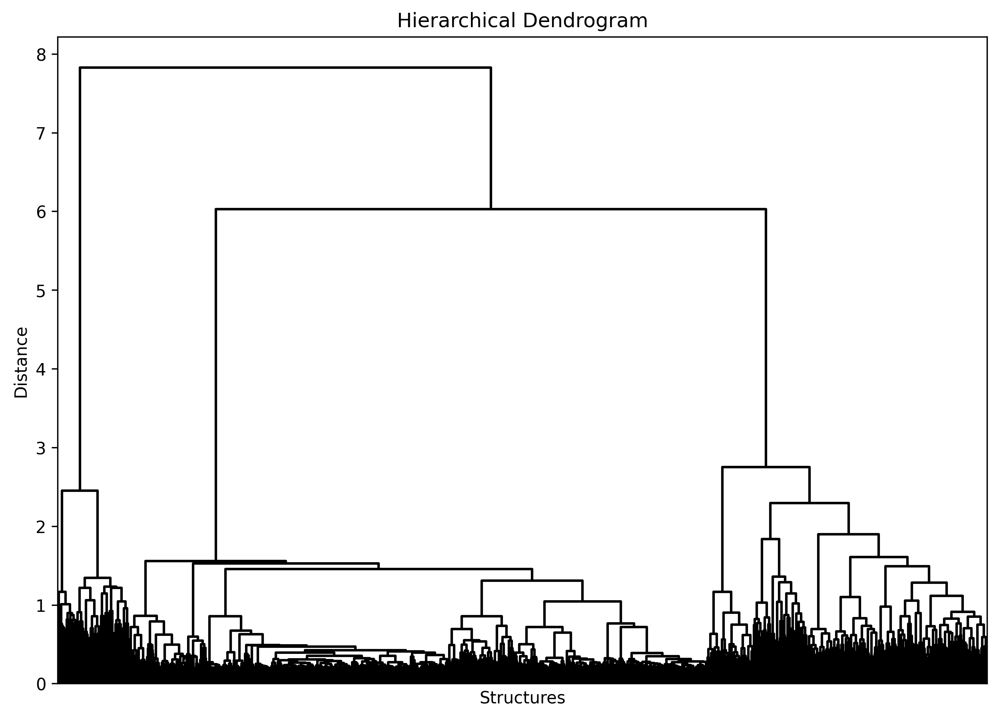

In [18]:
plt.figure(figsize=(10, 7), dpi=300, facecolor='w')
plt.title('Hierarchical Dendrogram')
plt.xlabel('Structures')
plt.ylabel('Distance')

dendrogram(
    Z,
    color_threshold=0,  # Ensures a single color for all branches
    leaf_rotation=90.,  # rotates the x axis labels
    leaf_font_size=8.,  # font size for the x axis labels
    no_labels=True,  # Hide the leaf labels
    above_threshold_color='k',  # Set the color above the threshold to black
)

plt.show()

In [19]:
max_d = 2.2  # Adjust this threshold to get the desired number of clusters
clusters = fcluster(Z, max_d, criterion='distance')

# Assuming 'clusters' contains the cluster labels for each spectrum
unique_clusters, counts = np.unique(clusters, return_counts=True)

# Print the number of clusters
num_clusters = len(unique_clusters)
print(f"Number of clusters formed: {num_clusters}")

# Optionally, print the number of spectra in each cluster
for cluster, count in zip(unique_clusters, counts):
    print(f"Cluster {cluster} contains {count} structures.")

Number of clusters formed: 6
Cluster 1 contains 104 structures.
Cluster 2 contains 281 structures.
Cluster 3 contains 3110 structures.
Cluster 4 contains 248 structures.
Cluster 5 contains 292 structures.
Cluster 6 contains 965 structures.


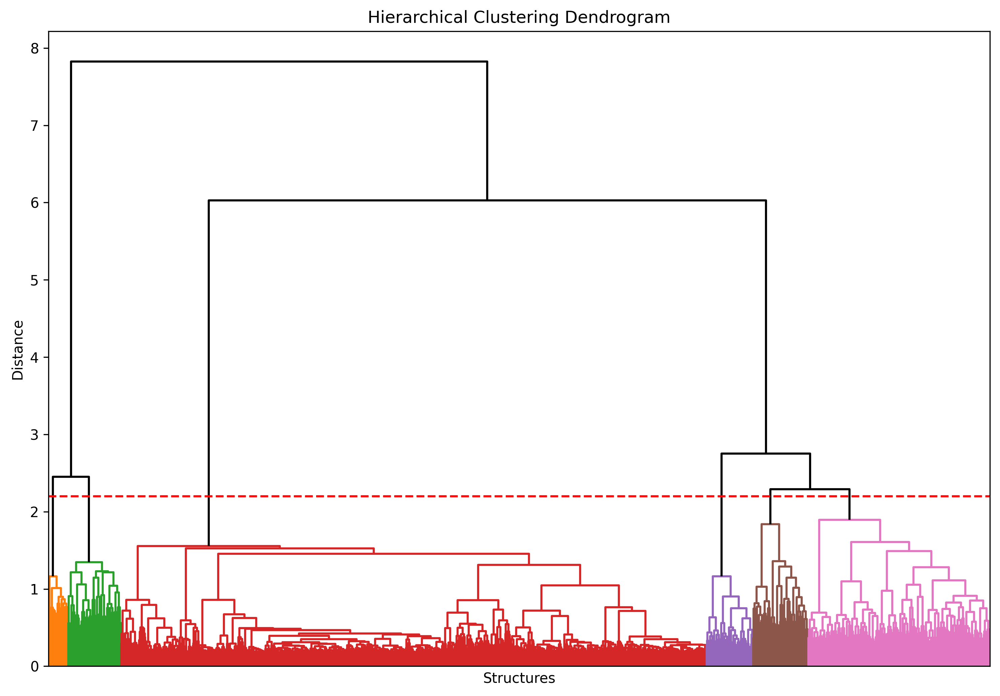

In [20]:
plt.figure(figsize=(10, 7), dpi=300, facecolor='w')
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Structures')
plt.ylabel('Distance')

dendrogram_result = dendrogram(
    Z,
    color_threshold=max_d,
    leaf_rotation=90.,
    leaf_font_size=8.,
    no_labels=True,  # Hide the leaf labels
    above_threshold_color='k',  # Set the color above the threshold to black
)

# Draw a horizontal line at the cut-off distance
plt.axhline(y=max_d, color='r', linestyle='--')

plt.tight_layout()
plt.show()

In [22]:
def visualize_clustered_mcq_matrix(mcq_df, Z, max_d):
    """
    Visualizes the MCQ matrix as a heatmap reordered by hierarchical clustering,
    with a flipped dendrogram on the left.

    Parameters:
    mcq_df (pd.DataFrame): Symmetric DataFrame of pairwise MCQ distances.
    Z (np.array): Linkage matrix.
    max_d (float): Distance threshold for clusters.
    """
    mcq_matrix = mcq_df.values
    labels = mcq_df.index.to_list()

    fig = plt.figure(figsize=(12, 8), dpi=300, facecolor='w')

    # Dendrogram on the left
    ax_dendro = fig.add_axes([0.05, 0.1, 0.225, 0.6], frame_on=False)
    dendro_result = dendrogram(
        Z,
        orientation='left',
        color_threshold=max_d,
        above_threshold_color='k',
        no_labels=True,
        ax=ax_dendro
    )
    ax_dendro.axis('off')

    # Flip the leaf order
    Z_idx = dendro_result['leaves'][::-1]  # <-- Flip here

    # Reorder matrix and labels accordingly
    reordered_matrix = mcq_matrix[Z_idx, :][:, Z_idx]
    reordered_labels = [labels[i] for i in Z_idx]

    # Heatmap
    ax_heatmap = fig.add_axes([0.16, 0.1, 0.65, 0.6])
    sns.heatmap(
        reordered_matrix,
        cmap='viridis',
        linewidths=0,
        square=True,
        cbar_kws={"shrink": .5},
        ax=ax_heatmap
    )
    ax_heatmap.set_xticks([])
    ax_heatmap.set_yticks([])

    plt.show()

    return reordered_matrix, reordered_labels

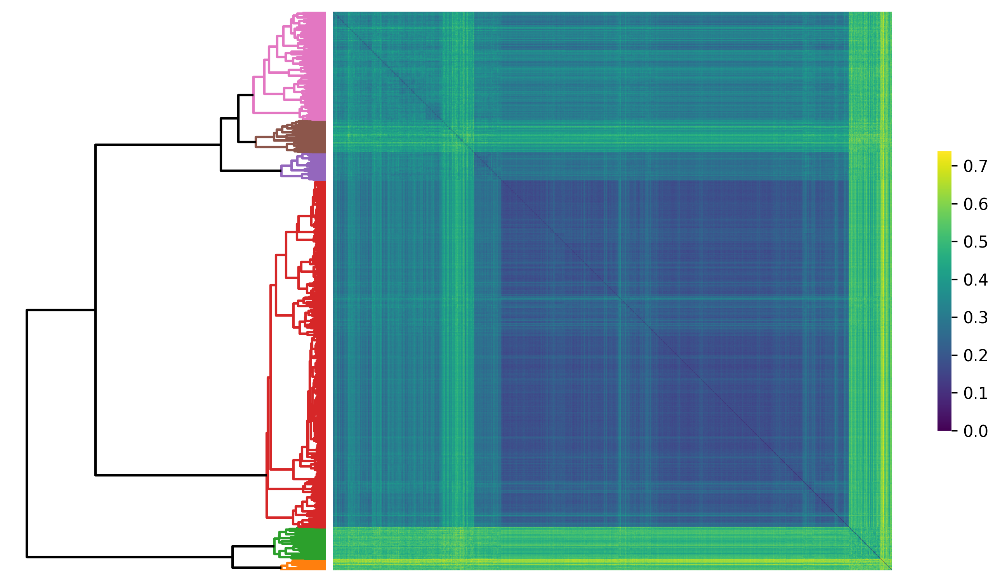

In [23]:
reordered_mcq, reordered_labels = visualize_clustered_mcq_matrix(pairwise_distances, Z, max_d)

In [ ]:
# Base directory where the 5000 PDBs are
pdb_dir = "/Volumes/Sim_Data/uni-bremen/miRNA/data/Sim/MD_duplex/amber99_parmbsc_chiOL3/REST/CD/DUPLEXES/selection/pdb_selection"

# Cluster assignments from fcluster
# `clusters` must be in same order as pairwise_distances.index
labels = pairwise_distances.index.tolist()
label_to_cluster = dict(zip(labels, clusters))

# Group PDB files by cluster
pdb_files_by_cluster = defaultdict(list)

for label in labels:
    cluster = label_to_cluster[label]
    pdb_path = os.path.join(pdb_dir, f"{label}.pdb")
    pdb_files_by_cluster[cluster].append(pdb_path)



In [25]:
import glob

# Get all .pdb files from the specified directory
all_pdb_files = []
for file in glob.glob(pdb_dir+"/*.pdb"):
    all_pdb_files.append(file)
    all_pdb_files = sorted(all_pdb_files)

def write_cluster_assignments(clusters, all_pdb_files, output_file):
    """
    Writes a text file listing each PDB file and its assigned cluster.

    Parameters:
    clusters (list): List of cluster indices corresponding to each PDB file.
    all_pdb_files (list): List of PDB file paths, ordered identically to clusters.
    output_file (str): Path to the output text file.
    """
    if len(clusters) != len(all_pdb_files):
        raise ValueError("Length of clusters and all_pdb_files must match.")
    
    with open(output_file, 'w') as f:
        for pdb, cluster in zip(all_pdb_files, clusters):
            f.write(f"{os.path.basename(pdb)}\t{cluster}\n")
    
    print(f"Cluster assignments written to {output_file}")

output_file = "/Volumes/Sim_Data/uni-bremen/miRNA/data/Sim/MD_duplex/amber99_parmbsc_chiOL3/REST/CD/DUPLEXES/selection/pdb_selection/pdb_cluster_assignments_mcq.txt"
write_cluster_assignments(clusters, all_pdb_files, output_file)

Cluster assignments written to /Volumes/Sim_Data/uni-bremen/miRNA/data/Sim/MD_duplex/amber99_parmbsc_chiOL3/REST/CD/DUPLEXES/selection/pdb_selection/pdb_cluster_assignments_mcq.txt


In [ ]:

for label in labels:
    cluster = label_to_cluster[label]
    pdb_path = os.path.join(pdb_dir, f"{label}.pdb")
    pdb_files_by_cluster[cluster].append(pdb_path)

# Write out cluster trajectories
def save_cluster_trajectories(pdb_files_by_cluster, output_folder):
    os.makedirs(output_folder, exist_ok=True)
    
    for cluster_id, pdb_files in pdb_files_by_cluster.items():
        cluster_file_path = os.path.join(output_folder, f"cluster_{cluster_id}.pdb")
        with PDBWriter(cluster_file_path, multiframe=True) as writer:
            for pdb_file in pdb_files:
                u = Universe(pdb_file)
                writer.write(u.atoms)
    
    print(f"Saved {len(pdb_files_by_cluster)} clustered trajectory files to: {output_folder}")

# Usage
output_folder = "/Volumes/Sim_Data/uni-bremen/miRNA/data/Sim/MD_duplex/amber99_parmbsc_chiOL3/REST/CD/DUPLEXES/selection/pdb_selection/clusters_MCQ"
save_cluster_trajectories(pdb_files_by_cluster, output_folder)

In [53]:
import glob

# Directory containing the .cd files
cd_dir = "/Volumes/Sim_Data/uni-bremen/miRNA/data/Sim/MD_duplex/amber99_parmbsc_chiOL3/REST/CD/DUPLEXES/selection"

# Get the list of actual files
cd_files_available = glob.glob(os.path.join(cd_dir, "miRNA-*.cd"))
cd_file_map = {os.path.basename(f): f for f in cd_files_available}

# Match the .cd file for each label
ordered_cd_files = []
missing_labels = []

for label in pairwise_distances.index:
    file_name = label.replace("_", "-") + ".cd"
    if file_name in cd_file_map:
        ordered_cd_files.append(cd_file_map[file_name])
    else:
        missing_labels.append(label)

if missing_labels:
    print(f"Warning: {len(missing_labels)} labels not matched to CD files:")
    print(missing_labels)

In [56]:
def parse_cd_file(file_path):
    """
    Parses a .cd file to extract wavelength and intensity data.
    
    Parameters:
    file_path (str): Path to the .cd file.
    
    Returns:
    tuple: Two numpy arrays containing the wavelength and intensity data.
    """
    wavelength = []
    intensity = []
    with open(file_path, 'r') as file:
        for line in file:
            parts = line.split()
            wavelength.append(float(parts[0]))
            intensity.append(float(parts[1])/50.0)
    return np.array(wavelength), np.array(intensity)

def plot_cluster_spectra_single(clusters, all_cd_files, cluster_id, color):
    """
    Plots all spectra and their average for one cluster, 
    """
    # Create a dictionary to hold file paths for each cluster
    cluster_files = {i: [] for i in set(clusters)}
    cluster_averages = {}

    # Assign files to the corresponding cluster
    for file, cluster in zip(all_cd_files, clusters):
        cluster_files[cluster].append(file)

    # Process each cluster
    for cluster, files in cluster_files.items():
        if cluster == cluster_id:
            # Create a square figure
            fig = plt.figure(figsize=(9, 9), dpi=300, facecolor='w')
            plt.subplots_adjust(left=0.15, bottom=0.15, right=0.85, top=0.85, wspace=None, hspace=0.05)
            all_spectra = []

            # Read and plot each file in the cluster
            for file in files:
                wavelength, intensity = parse_cd_file(file)
                plt.plot(wavelength, intensity, color='black', linewidth=0.2, alpha=0.3)
                all_spectra.append(intensity)

            # Calculate and plot the average spectrum
            average_spectrum = np.mean(all_spectra, axis=0)
            STD = np.std(all_spectra, axis=0)
            cluster_averages[cluster] = (wavelength, average_spectrum)
            plt.plot(wavelength, average_spectrum, color=color, linewidth=3, label='Average')
            plt.fill_between(wavelength, average_spectrum - STD, average_spectrum + STD, color=color, alpha=0.3)

            # Customizing the plot
            plt.xlabel(r'wave length $\lambda$ (nm)', fontsize=30)
            plt.ylabel(r'$\theta_{MRE}$ $10^3$ (deg cm$^2$ dmol$^{-1}$)', fontsize=30)
            plt.ylim([-70,70])
            plt.xlim([180,320])

            ax1 = plt.gca()
            for tick in ax1.xaxis.get_major_ticks():
                tick.label1.set_fontsize(25)
            for tick in ax1.yaxis.get_major_ticks():
                tick.label1.set_fontsize(25)
            #plt.title(f'Cluster {cluster} Spectra')
            #plt.xlim([180,320])
            #plt.xlabel(r'wavelength $\lambda$ [nm]', fontsize='large')
            #plt.ylabel(r'$\theta_{MRE}$ $10^3$ [deg cm$^2$ dmol$^{-1}$]', fontsize='large')
            #plt.legend()
            plt.show()

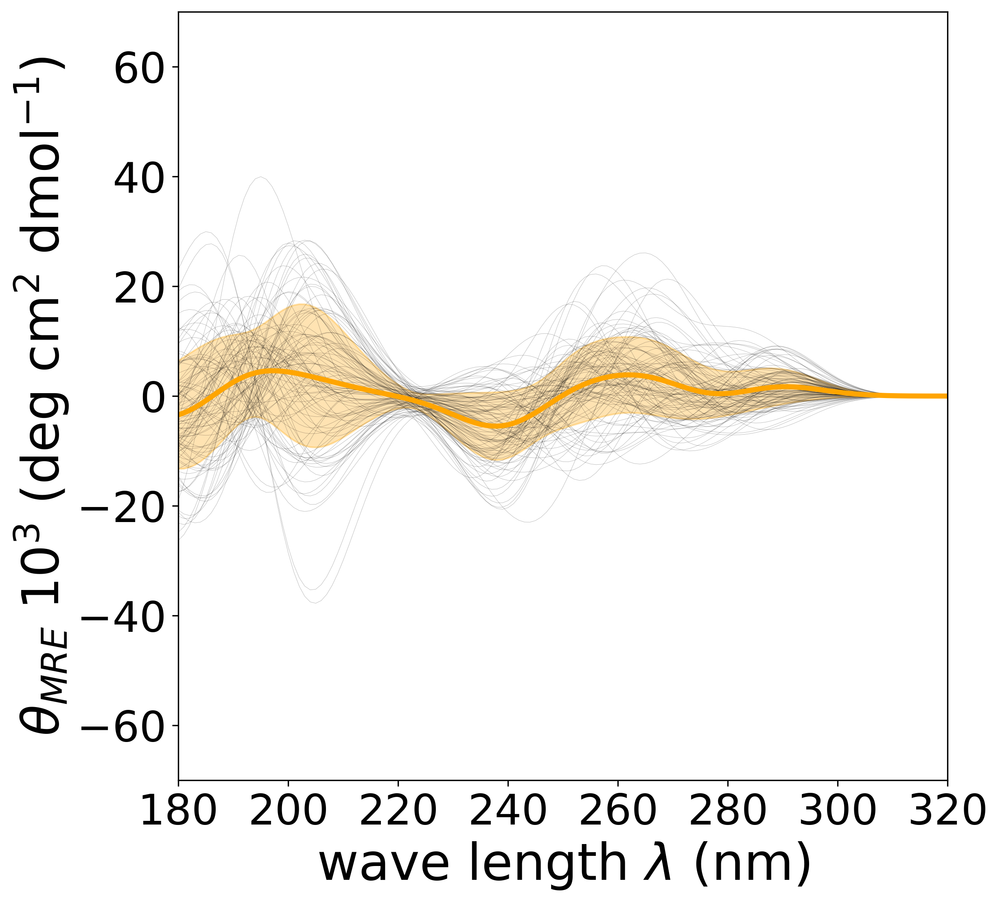

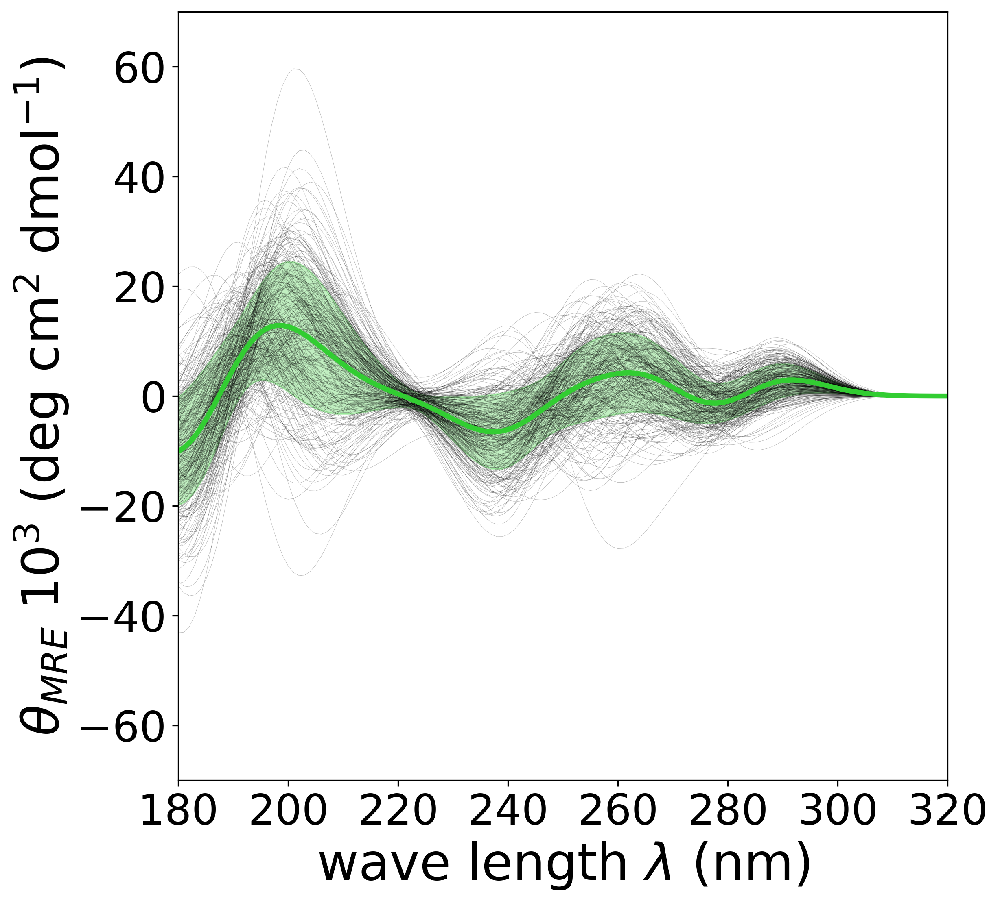

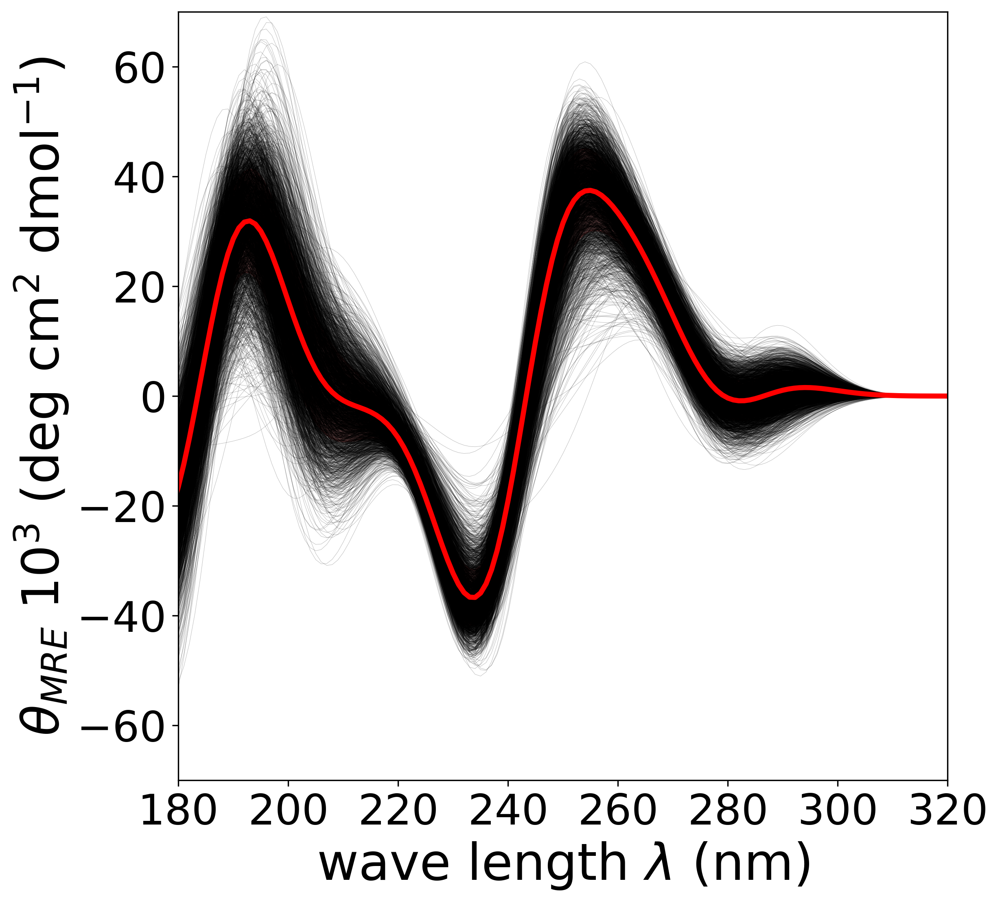

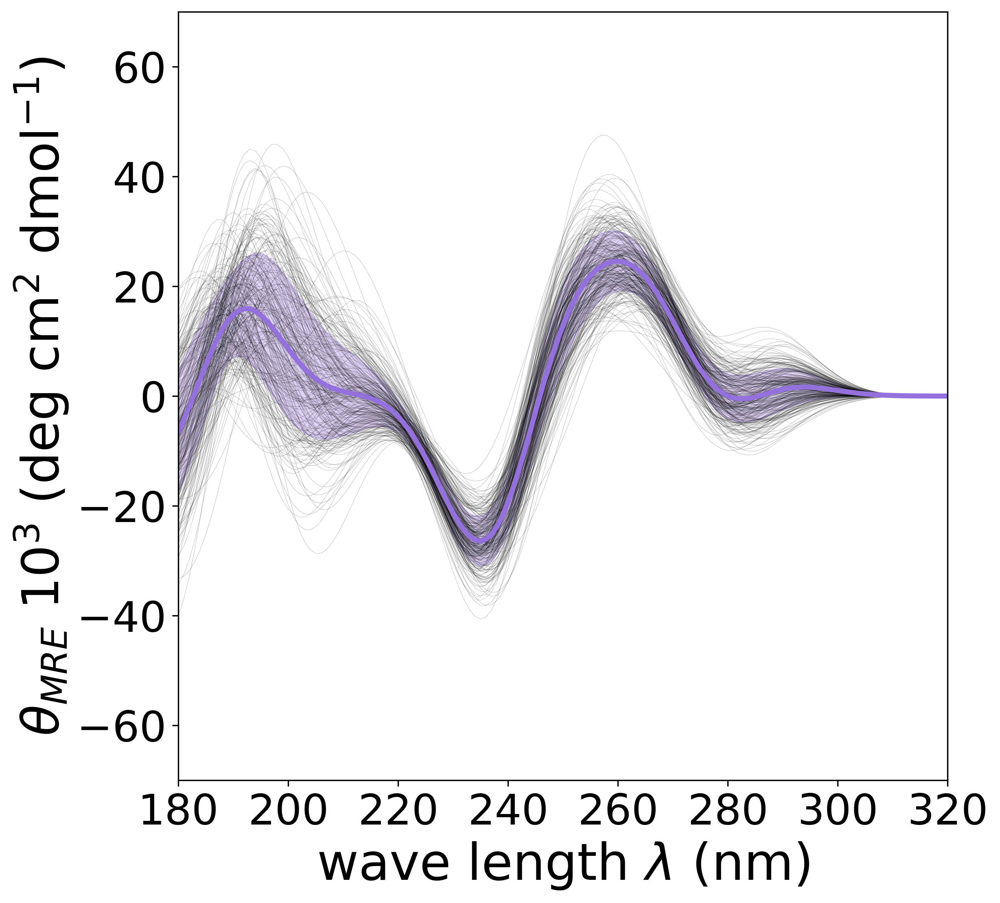

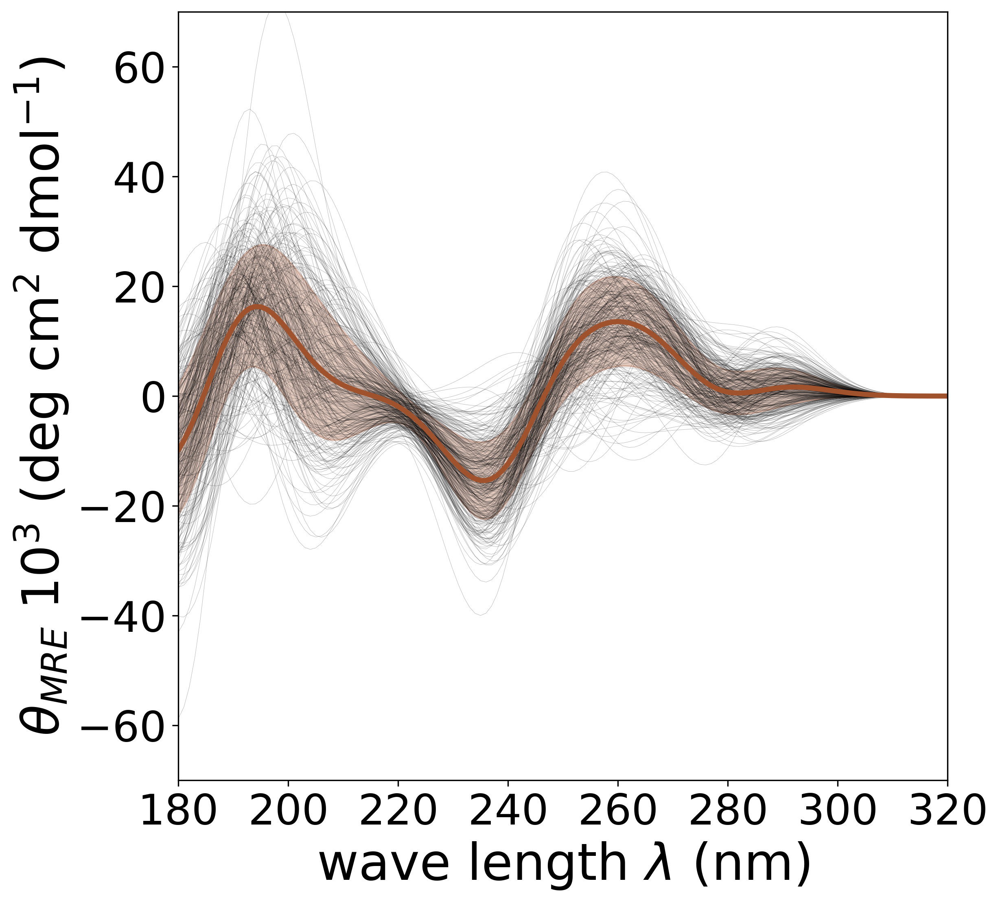

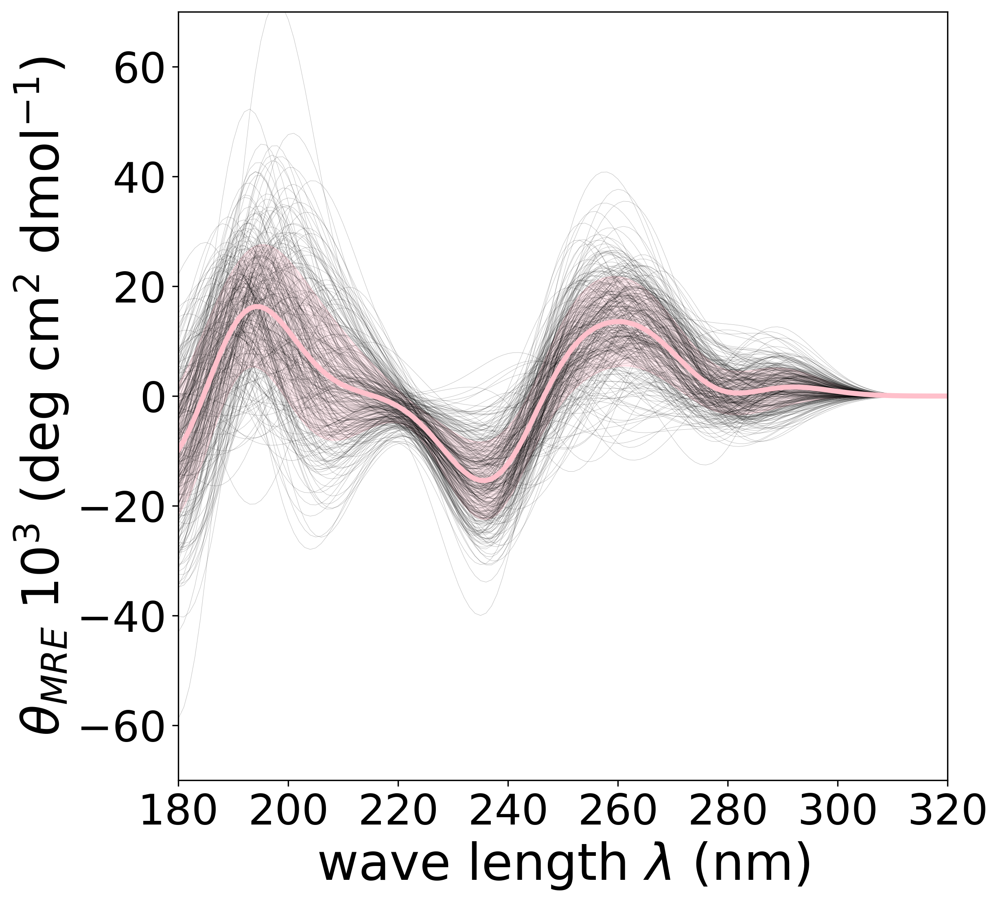

In [58]:
plot_cluster_spectra_single(clusters, ordered_cd_files, cluster_id=1, color="orange")
plot_cluster_spectra_single(clusters, ordered_cd_files, cluster_id=2, color="limegreen")
plot_cluster_spectra_single(clusters, ordered_cd_files, cluster_id=3, color="r")
plot_cluster_spectra_single(clusters, ordered_cd_files, cluster_id=4, color="mediumpurple")
plot_cluster_spectra_single(clusters, ordered_cd_files, cluster_id=5, color="sienna")
plot_cluster_spectra_single(clusters, ordered_cd_files, cluster_id=5, color="pink")

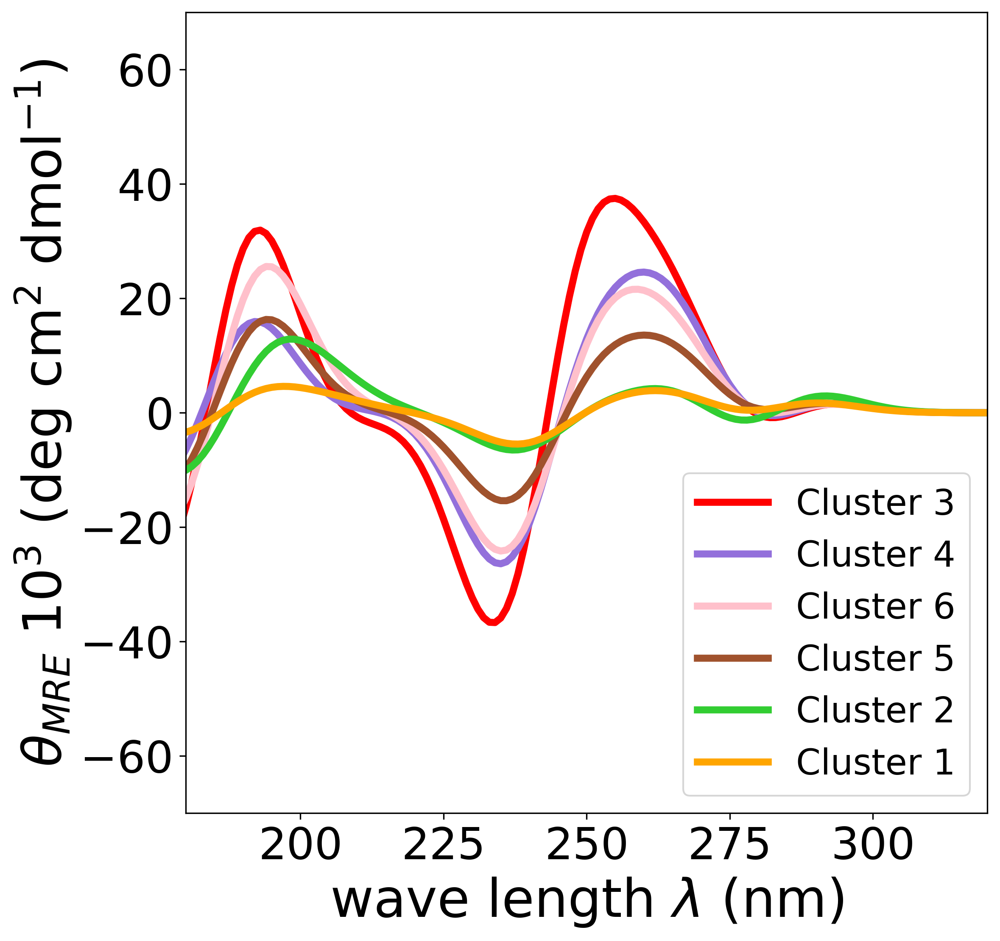

In [59]:
def plot_cluster_average_spectra(clusters, all_cd_files):
    """
    Plots the average spectra of all clusters in a single figure.
    
    Parameters:
    clusters (array): An array with cluster labels for each spectrum.
    all_cd_files (list): List of file paths for the spectra.
    """
    import matplotlib.pyplot as plt
    import numpy as np

    color_sequence = ['orange', 'limegreen', 'r', 'mediumpurple', 'sienna', 'pink']
    color_mapping = {i+1: color_sequence[i] if i < len(color_sequence) else 'black' for i in range(len(set(clusters)))}

    # Group files by cluster
    from collections import defaultdict
    cluster_files = defaultdict(list)
    for file, cluster in zip(all_cd_files, clusters):
        cluster_files[cluster].append(file)

    cluster_averages = {}

    # Compute average spectra per cluster
    for cluster, files in cluster_files.items():
        all_spectra = []
        for file in files:
            wavelength, intensity = parse_cd_file(file)
            all_spectra.append(intensity)
        average_spectrum = np.mean(all_spectra, axis=0)
        cluster_averages[cluster] = (wavelength, average_spectrum)

    # Plot only the average spectra for each cluster
    fig = plt.figure(figsize=(9, 9), dpi=300, facecolor='w')
    plt.subplots_adjust(left=0.15, bottom=0.15, right=0.85, top=0.85)

    for cluster, (wavelength, avg_spectrum) in cluster_averages.items():
        color = color_mapping.get(cluster, 'black')
        plt.plot(wavelength, avg_spectrum, color=color, linewidth=4, label=f'Cluster {cluster}')

    plt.xlabel(r'wave length $\lambda$ (nm)', fontsize=30)
    plt.ylabel(r'$\theta_{MRE}$ $10^3$ (deg cm$^2$ dmol$^{-1}$)', fontsize=30)
    plt.ylim([-70,70])
    plt.xlim([180,320])

    ax = plt.gca()
    ax.tick_params(axis='both', labelsize=25)

    plt.legend(fontsize=20)
    plt.show()

plot_cluster_average_spectra(clusters, ordered_cd_files)